In [1]:
import plotly.figure_factory as ff
import numpy as np
import torch 
from opacus.accountants.utils import get_noise_multiplier
from opacus import PrivacyEngine

path_base = '/home/featurize/result/models/server/iid_P_FedAVG_iid_Lenet_200.pth.tar'
path_ldp = '/home/featurize/result/models/server/iid_P_FedAVG_iid_Lenet_LDP_200.pth.tar'
path_cdp = '/home/featurize/result/models/server/iid_P_FedAVG_iid_Lenet_CDP_200.pth.tar'
path_sign = '/home/featurize/result/models/server/iid_P_FedAVG_iid_Lenet_SIGN_200.pth.tar'

weight_base = torch.load(path_base)
weight_ldp = torch.load(path_ldp)
weight_cdp = torch.load(path_cdp)
weight_sign = torch.load(path_sign)

In [11]:
def weight_to_vec(weight):    
    hist_data = []
    group_labels = []
    all_weight = []

    for key,value in weight.items():
        hist_data.append(value.view(-1).detach().cpu().numpy().tolist())
        group_labels.append(key)
        all_weight.append(value.view(-1))
        # print(key,len(hist_data[-1]))

    # all_weight = torch.cat(all_weight).detach().cpu().numpy().tolist()
    all_weight = torch.cat(all_weight)
    return all_weight

def get_mean_var(vec):
    return (torch.mean(vec).item(),torch.var(vec).item())

def add_noise(vec,epsilon=5,delta=0.00001,rate=1,epochs=1):
    noise = get_noise_multiplier(target_epsilon=epsilon,target_delta=delta,sample_rate=rate,epochs=epochs,accountant='rdp')
    added_vec = vec + 1/5*torch.normal(0,noise,size=vec.shape,device=vec.device)


In [4]:
vec_list = [weight_to_vec(weight_base),weight_to_vec(weight_ldp),weight_to_vec(weight_cdp),weight_to_vec(weight_sign)]
vec_mean_var_list = [get_mean_var(i) for i in vec_list]
print(vec_mean_var_list)

[(-0.013810055330395699, 0.009945004247128963), (-0.0056100869551301, 0.9533460736274719), (-0.035048097372055054, 0.07587938010692596), (-0.008235491812229156, 0.0034953011199831963)]


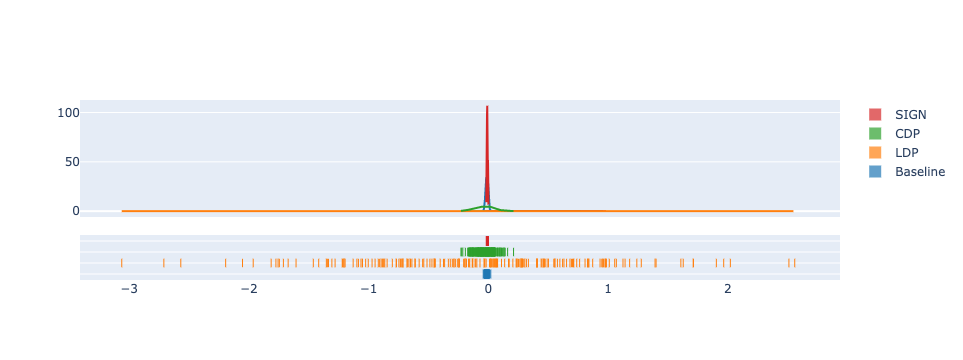

In [7]:
hists = [np.random.normal(i[0], i[1], 200) for i in vec_mean_var_list]
names = ['Baseline','LDP','CDP','SIGN']

fig = ff.create_distplot(hists,names,show_hist=True)
fig.show()

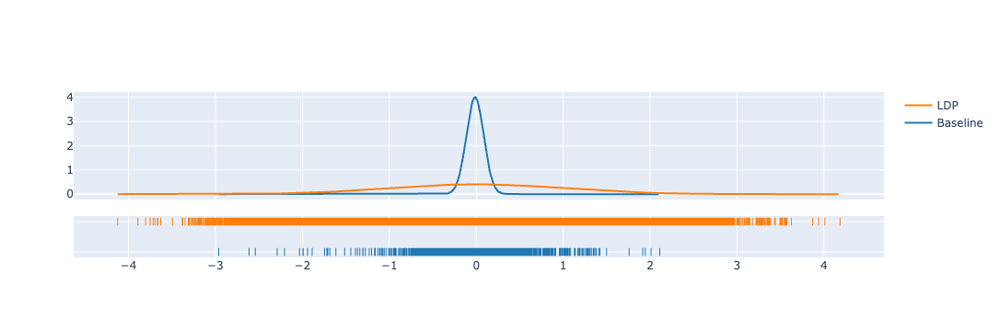

In [11]:
vec_list = [weight_to_vec(weight_base),weight_to_vec(weight_ldp)]
vec_name = ['Baseline','LDP']

fig = ff.create_distplot(vec_list,vec_name,show_hist=False,curve_type='normal')
fig.show()

In [14]:
from opacus.accountants.utils import get_noise_multiplier
from opacus import PrivacyEngine
noise_5 = get_noise_multiplier(target_epsilon=5,target_delta=0.00001,sample_rate=1,epochs=1,accountant='rdp')
noise_10 = get_noise_multiplier(target_epsilon=10,target_delta=0.00001,sample_rate=1,epochs=1,accountant='rdp')
noise_15 = get_noise_multiplier(target_epsilon=15,target_delta=0.00001,sample_rate=1,epochs=1,accountant='rdp')
noise_20 = get_noise_multiplier(target_epsilon=20,target_delta=0.00001,sample_rate=1,epochs=1,accountant='rdp')

weight_base_cdp_5 = (vec_list[0] + 1/5*torch.normal(0,noise_5,size=vec_list[0].shape,device=vec_list[0].device)).detach().cpu().numpy().tolist()
weight_base_cdp_10 = (vec_list[0] + 1/5*torch.normal(0,noise_10,size=vec_list[0].shape,device=vec_list[0].device)).detach().cpu().numpy().tolist()
weight_base_cdp_15 = (vec_list[0] + 1/5*torch.normal(0,noise_15,size=vec_list[0].shape,device=vec_list[0].device)).detach().cpu().numpy().tolist()
weight_base_cdp_20 = (vec_list[0] + 1/5*torch.normal(0,noise_20,size=vec_list[0].shape,device=vec_list[0].device)).detach().cpu().numpy().tolist()

weight_base_sign = torch.sign(vec_list[0]).detach().cpu().numpy().tolist()

In [4]:
hist = [all_weight.detach().cpu().numpy().tolist(),all_weight_cdp_5,all_weight_sign]
labels = ['FedAvg','CDP_5','SIGN']
fig = ff.create_distplot(hist,labels,show_hist=True,bin_size=0.001)
fig.show()

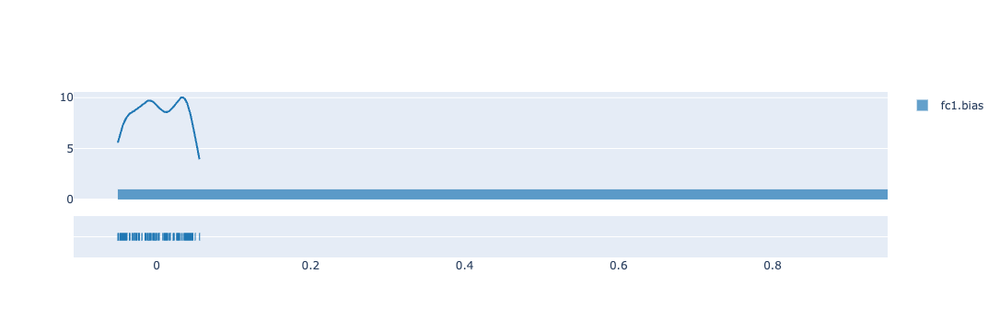

In [6]:
fig = ff.create_distplot(hist_data[6:7], group_labels[6:7])
fig.show()